In [1]:
import nltk
import pandas as pd
import re
import spacy
nlp = spacy.load('en')
import numpy as np
from fuzzywuzzy import fuzz
import docx2txt
import PyPDF2
from nltk.corpus import stopwords
import string
import numpy as np
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfpage import PDFPage
from io import StringIO

C:\Users\tejas\Anaconda3\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:

def convertPDFToText(path):
    rsrcmgr = PDFResourceManager()
    retstr = StringIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, laparams=laparams)
    fp = open(path, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    password = ""
    maxpages = 0
    caching = True
    pagenos=set()
    for page in PDFPage.get_pages(fp, pagenos, maxpages=maxpages, password=password,caching=caching, check_extractable=True):
        interpreter.process_page(page)
    fp.close()
    device.close()
    string = retstr.getvalue()
    retstr.close()
    return string

In [3]:
from nltk.corpus import stopwords
import re
def pos(text):
    pos_tags = []
    #text = ' '.join(text)
    for i in text:
        doc = nlp(i)
        temp = []
        for token in doc:
            temp.append((token,token.pos_))
        pos_tags.append(temp)
    return(pos_tags)
def entity(text):
    ent = []
    #text = ' '.join(text)
    for i in text:
        doc = nlp(i)
        temp = []
        for token in doc.ents:
            temp.append((token.text,token.label_))
#             print(doc.ents)
        ent.append(temp)
    return(ent)
def remove_stopwords(word_list):
        # List of Englisg stopwords
        eng_stopwords = stopwords.words('english')
#         nouns = []
#         for item in word_list:
        temp = []
        for word in word_list:
            if word not in eng_stopwords:
                temp.append(word)
#         nouns.append(temp)
        return(temp)
def clean(text):
        # Filter out characters which are not alphabets
    text = re.sub(r'[^a-zA-Z-+ ,@/\']', ' ',text)
    text = re.sub(' +', ' ',text)
        # Coverting to lowercase letters
#     text = text.lower()
    return text

In [4]:
combine_data=pd.DataFrame()

In [5]:
# extract=convertPDFToText("cv/Aanand D. Naik, M.D. _ People _ Houston, Texas.pdf")

In [6]:

extract = docx2txt.process("combined new.docx")

In [7]:
for data in extract.split("\n")[75:]:
#     if len(data)and data:
    print(data)


		

		

		

		

		

		

		Directorate General of Audit (Headquarters)

		





Type of Formation

Post / Charged Role

Activity

Domain Competencies

Directorate General

of Audit, Headquarters, New Delhi

Post : Principal Director General

(Pr.DG)/ Director General (DG) Charge : Directorate General of Audit.

The Pr. DG/ DG is the overall in-charge and head of the DG Audit who controls all the functioning of the Directorate.

She is responsible for overall supervision, control and effective functioning of the Directorate.

She monitors and supervises the working of all the Zonal Units under jurisdiction of the Directorate presently located at Ahmedabad, Bangalore, Chennai, Delhi, Hyderabad, Kolkata and Mumbai.

As all India Head of DG Audit, she provides necessary directions for evolution and improvement of Audit techniques.

Role assigned:

			1. To support and advice to the CBIC in policy	formation,	coordination	and

	Issuance of Audit Action Plan for

the Audit Commissionerates

	


	Exposure to Customs and Income Tax Law and Procedure, Company Law and Allied business Laws

	General Financial Rules, CCA Rules,









Leave Rules

	CVC Manual and CAT / Vigilance Case Laws

	Human Resources Management

	Leadership and Project Management

	Communication skills

	International best practices in taxation

O/o The Chief

Commissioner (AR), Customs, Excise and Service Tax Appellate Tribunal

Chief

Commissioner /

	Head of Office and associated activities

	to maintain Co-ordination and liaison with the Hon'ble President, CESTAT/Registry;

	to ensure speedy disposal of appeals involving high revenue stakes, all India ramifications or a vexatious point of law;

	to receive the cause list of cases from the Tribunal registry and distribute the case file among Authorize Representatives (ARs);

	to monitor effective, efficient and forceful presentation of the cases, on behalf of the Revenue, by ARs in all listed cases before the benches of the CESTAT and to guide them for 

for Ex-Servicemen.







4

Supervision over issuance of Seniority List in various grades







5

Departmental Promotion Committee (DPC), ACP/MACP







6

Supervision of Tender/GNIT.

Master Guide/ GFR—2017





7

Infrastructure development

Manual of Infrastructure, CBIC





8

Supervision over Vigilance Complaint Handling Procedure and its

	Manual   on Disciplinary  proceedings	Conduct







disposal

Rules/ Vigilance Manual/ CCS (CCA) Ru1es,1965/







Supervision over Disciplinary proceedings CCS(CCA)Rules)

				CCS	(Conduct)	Rules,1964/	The	Complaint









Handling policy of CBIC/ Handbook for inquiry









officer & Disciplinary Authorities











(ii) Technical :







1

Director (Revenue Laboratories) exercises control over the technical

work of the laboratory and over the quality o1 work of every chemist o1 the organization. He kept in touch with the problem as they arise and he issues instructions about solvlng them.

Director (Revenue Laboratories) is 

Co-ordination with COIN and MEA

Work related to PMO references

Correspondence with NCB/Anti-Smuggling/CEIB

Supervision of investigation of cases







Customs Act, 1962

NDPS Act, 1985

Wildlife Protection Act, 1972

Prevention of Money Laundering Act, 2002

Exposure to CrPC, Evidence Act and IPC

Communication skills to interact with other stakeholders

Human Resources Management 







Deputy/ Assistant Director –Policy



All work related to :



COIN reports

Requests for overseas investigative assistance by field formation

Customs Mutual Assistance Agreements/Bilateral & Multilateral Talks

Processing of MLAT(Mutual Legal Assistance Treaty /LR requests/ Extradition requests

All International operations RILO AP/ RILO CIS coordination

Systems related issues under DIGIT/EDW/NDRI/NEDRI etc

Parliamentary Questions & PAs

Inter-agency coordination

Maintenance and Updation of DRI website 



Customs Act, 1962

Exposure to procedures of Mutual Legal Assistance Treaties/LR

Coord

In [8]:
from docx.api import Document
import pandas as pd

In [9]:
document=Document("combined new.docx")

In [10]:
combine_data=pd.DataFrame()

In [11]:
data=[]
data_1=[]
i=17
for j, row in enumerate(document.tables[i].rows):
#     print(len(document.tables[i].rows))
    if len(document.tables[i].rows)>1: 
#         print("abcd")
        text=(cell.text for cell in row.cells)
        if j==0 :
            keys=tuple(text)
            continue
        row_data=dict(zip(keys,text))
        data.append(row_data)
    elif len(document.tables[i].rows)==1:
#         print("xyz")
        data_1=[[cell.text for cell in row.cells]]
if len(data)>0:
    df=pd.DataFrame(data)
    df.columns=["type_of_formation","post_charged_role","activity","domain_competencies"]
elif len(data_1)>0:
    df=pd.DataFrame(data_1,columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [12]:
data=[]
data_1=[]
i=2
for j, row in enumerate(document.tables[i].rows):
#     print(len(document.tables[i].rows))
    if len(document.tables[i].rows)>1: 
#         print("abcd")
        text=(cell.text for cell in row.cells)
        if j==0 :
            keys=tuple(text)
            continue
        row_data=dict(zip(keys,text))
        data.append(row_data)
    elif len(document.tables[i].rows)==1:
#         print("xyz")
        data_1=[[cell.text for cell in row.cells]]
if len(data)>0:
    df=pd.DataFrame(data)
    df.columns=["type_of_formation","post_charged_role","activity","domain_competencies"]
elif len(data_1)>0:
    df=pd.DataFrame(data_1,columns=["type_of_formation","post_charged_role","activity","domain_competencies"])

In [14]:
combine_data

,type_of_formation,post_charged_role,activity,domain_competencies
0,,6. Attends to any other additional charge that...,,


In [15]:
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [16]:
df

,type_of_formation,post_charged_role,activity,domain_competencies
0,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."


In [17]:
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [18]:
df

,type_of_formation,post_charged_role,activity,domain_competencies
0,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."


In [19]:
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")
combine_data

,type_of_formation,post_charged_role,activity,domain_competencies
0,,6. Attends to any other additional charge that...,,
1,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."
2,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."
3,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."


In [20]:
combine_data=pd.read_excel("new_dataframe.xlsx")

In [21]:
combine_data

,Type of Formation,POST,Post / Charged Role,Activity,Domain Competencies
0,"Directorate General of Audit, Headquarters, Ne...",Post : Principal Director General,(Pr.DG)/ Director General (DG) Charge : Direct...,1.Issuance of Audit Action Plan for the Audit ...,1.Exhaustive and Comprehensive knowledge of GS...
1,"Directorate General of Audit, Headquarters, Ne...",Principal Additional Director,The Pr.ADG/ ADG (Hqrs.) is the assisting head ...,Assisting the DG in the following: -\n1.Issuan...,1.Exhaustive and Comprehensive knowledge of GS...
2,"Directorate General of Audit, Headquarters, Ne...",Post : Additional Director,The Addl. Director/Joint Director supervises\n...,Acting under guidance and on behalf\nof ADG. S...,1.Exhaustive and Comprehensive knowledge of GS...
3,"Directorate General of Audit, Headquarters, Ne...",Post :Deputy / Assistant Director,The Deputy / Assistant Director assists the Ad...,1. Acting under the guidance of ADG / Addl. Di...,1.Knowledge of GST Law and Procedure.\n2.Knowl...
4,Directorate General of Audit Zonal Unit,Post : Principal Additional Director,The Pr. ADG/ ADG is the Administrative head of...,1.Guidance and Supervision for the preparation...,1.Exhaustive and comprehensive knowledge of GS...
...,...,...,...,...,...
112,RMCC-Mumbai,Deputy / Assistant Director,NaN,Exports CSM\nESEAL\n,1. Proficiency in custom Act in Procedures\n2....
113,RMCC-Mumbai,Deputy / Assistant Director,NaN,Valuation,1. Proficiency in custom Act in Procedures\n2....
114,RMCC-Mumbai,Deputy / Assistant Director,NaN,PCA/ IPR,1. Proficiency in custom Act in Procedures\n2....
115,RMCC-Mumbai,Deputy / Assistant Director,NaN,System & IT,1. Knowledge of Custom Act and Procedures\n2. ...


In [22]:
input_text=" ".join(list(combine_data.domain_competencies))

AttributeError: 'DataFrame' object has no attribute 'domain_competencies'

In [25]:

combine_data

,Type of Formation,POST,Post / Charged Role,Activity,Domain Competencies
0,"Directorate General of Audit, Headquarters, Ne...",Post : Principal Director General,(Pr.DG)/ Director General (DG) Charge : Direct...,1.Issuance of Audit Action Plan for the Audit ...,1.Exhaustive and Comprehensive knowledge of GS...
1,"Directorate General of Audit, Headquarters, Ne...",Principal Additional Director,The Pr.ADG/ ADG (Hqrs.) is the assisting head ...,Assisting the DG in the following: -\n1.Issuan...,1.Exhaustive and Comprehensive knowledge of GS...
2,"Directorate General of Audit, Headquarters, Ne...",Post : Additional Director,The Addl. Director/Joint Director supervises\n...,Acting under guidance and on behalf\nof ADG. S...,1.Exhaustive and Comprehensive knowledge of GS...
3,"Directorate General of Audit, Headquarters, Ne...",Post :Deputy / Assistant Director,The Deputy / Assistant Director assists the Ad...,1. Acting under the guidance of ADG / Addl. Di...,1.Knowledge of GST Law and Procedure.\n2.Knowl...
4,Directorate General of Audit Zonal Unit,Post : Principal Additional Director,The Pr. ADG/ ADG is the Administrative head of...,1.Guidance and Supervision for the preparation...,1.Exhaustive and comprehensive knowledge of GS...
...,...,...,...,...,...
112,RMCC-Mumbai,Deputy / Assistant Director,NaN,Exports CSM\nESEAL\n,1. Proficiency in custom Act in Procedures\n2....
113,RMCC-Mumbai,Deputy / Assistant Director,NaN,Valuation,1. Proficiency in custom Act in Procedures\n2....
114,RMCC-Mumbai,Deputy / Assistant Director,NaN,PCA/ IPR,1. Proficiency in custom Act in Procedures\n2....
115,RMCC-Mumbai,Deputy / Assistant Director,NaN,System & IT,1. Knowledge of Custom Act and Procedures\n2. ...


In [27]:
input_text=pos([clean(text) for text in combine_data['Domain Competencies'].astype(str)])

In [28]:
input_text

[[( , 'SPACE'),
  (Exhaustive, 'PROPN'),
  (and, 'CCONJ'),
  (Comprehensive, 'ADJ'),
  (knowledge, 'NOUN'),
  (of, 'ADP'),
  (GST, 'PROPN'),
  (Law, 'PROPN'),
  (and, 'CCONJ'),
  (Procedure, 'PROPN'),
  (Complete, 'PROPN'),
  (knowledge, 'NOUN'),
  (of, 'ADP'),
  (Customs, 'PROPN'),
  (Law, 'PROPN'),
  (and, 'CCONJ'),
  (procedure, 'VERB'),
  (Exhaustive, 'ADJ'),
  (knowledge, 'NOUN'),
  (of, 'ADP'),
  (GST, 'PROPN'),
  (Audits, 'PROPN'),
  (along, 'ADP'),
  (with, 'ADP'),
  (case, 'NOUN'),
  (studies, 'NOUN'),
  (Knowledge, 'PROPN'),
  (of, 'ADP'),
  (risk, 'NOUN'),
  (Analysis, 'PROPN'),
  (Knowledge, 'PROPN'),
  (of, 'ADP'),
  (financial, 'ADJ'),
  (intelligence, 'NOUN'),
  (,, 'PUNCT'),
  (Fiscal, 'PROPN'),
  (Law, 'PROPN'),
  (enforcement, 'NOUN'),
  (,, 'PUNCT'),
  (Trade, 'PROPN'),
  (based, 'VERB'),
  (Money, 'PROPN'),
  (Laundering, 'PROPN'),
  (,, 'PUNCT'),
  (prevention, 'NOUN'),
  (of, 'ADP'),
  (commercial, 'ADJ'),
  (frauds, 'NOUN'),
  (,, 'PUNCT'),
  (evasion, 'NOUN'),
 

In [29]:
# input_text=pos([clean(text) for text in combine_data.domain_competencies])
clean_text=[]
for sentence in input_text:
    for pair in sentence:
        print(pair)
        if pair[1] in ["NOUN","PROPN"]:
            if sentence.index(pair)>0:
#                 print(sentence.index(pair))
                if sentence[sentence.index(pair)-1][1] in ["ADJ"]:
                    combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                    clean_text.append(combine_text)
                
                else:
                    clean_text.append(str(pair[0]))
input_text=" ".join(clean_text)

( , 'SPACE')
(Exhaustive, 'PROPN')
(and, 'CCONJ')
(Comprehensive, 'ADJ')
(knowledge, 'NOUN')
(of, 'ADP')
(GST, 'PROPN')
(Law, 'PROPN')
(and, 'CCONJ')
(Procedure, 'PROPN')
(Complete, 'PROPN')
(knowledge, 'NOUN')
(of, 'ADP')
(Customs, 'PROPN')
(Law, 'PROPN')
(and, 'CCONJ')
(procedure, 'VERB')
(Exhaustive, 'ADJ')
(knowledge, 'NOUN')
(of, 'ADP')
(GST, 'PROPN')
(Audits, 'PROPN')
(along, 'ADP')
(with, 'ADP')
(case, 'NOUN')
(studies, 'NOUN')
(Knowledge, 'PROPN')
(of, 'ADP')
(risk, 'NOUN')
(Analysis, 'PROPN')
(Knowledge, 'PROPN')
(of, 'ADP')
(financial, 'ADJ')
(intelligence, 'NOUN')
(,, 'PUNCT')
(Fiscal, 'PROPN')
(Law, 'PROPN')
(enforcement, 'NOUN')
(,, 'PUNCT')
(Trade, 'PROPN')
(based, 'VERB')
(Money, 'PROPN')
(Laundering, 'PROPN')
(,, 'PUNCT')
(prevention, 'NOUN')
(of, 'ADP')
(commercial, 'ADJ')
(frauds, 'NOUN')
(,, 'PUNCT')
(evasion, 'NOUN')
(in, 'ADP')
(wrong, 'ADJ')
(availment, 'NOUN')
(of, 'ADP')
(ITC, 'PROPN')
(/, 'SYM')
(IGST, 'PROPN')
(refunds, 'VERB')
(Knowledge, 'PROPN')
(in, 'ADP')

(Property, 'PROPN')
(Reciept, 'PROPN')
(,, 'PUNCT')
(Management, 'PROPN')
(and, 'CCONJ')
(Disposal, 'PROPN')
(Rules, 'PROPN')
(,, 'PUNCT')
(o, 'PROPN')
(Financial, 'PROPN')
(Investigation, 'PROPN')
(and, 'CCONJ')
(money, 'NOUN')
(laundering, 'NOUN')
(o, 'PUNCT')
(Knowledge, 'PROPN')
(of, 'ADP')
(provisions, 'NOUN')
(of, 'ADP')
(I, 'PRON')
(P, 'NOUN')
(C, 'NOUN')
(,, 'PUNCT')
(Cr, 'PROPN')
(P, 'PROPN')
(C, 'PROPN')
(,, 'PUNCT')
(and, 'CCONJ')
(Evidence, 'PROPN')
(Act, 'PROPN')
(o, 'NOUN')
(DGFT, 'PROPN')
(Notification, 'NOUN')
(No, 'PROPN')
(Exp, 'PROPN')
(PN, 'PROPN')
(-, 'PUNCT')
(,, 'PUNCT')
(Dated, 'VERB')
(-, 'PUNCT')
(-, 'PUNCT')
(o, 'NOUN')
(DGFT, 'NOUN')
(Notification, 'NOUN')
(No, 'NOUN')
(RE-, 'NOUN')
(/l, 'PUNCT')
(-, 'PUNCT')
(dated, 'VERB')
(-, 'PUNCT')
(-, 'PUNCT')
(o, 'NOUN')
(DGFT, 'NOUN')
(Notification, 'NOUN')
(No, 'INTJ')
(RE, 'PROPN')
(-, 'PUNCT')
(dated, 'VERB')
(-, 'PUNCT')
(-, 'PUNCT')
(o, 'NOUN')
(DGFT, 'NOUN')
(Notification, 'NOUN')
(No, 'INTJ')
(RE, 'PROPN')
(/

(Staff, 'PROPN')
(work, 'NOUN')
(for, 'ADP')
(making, 'VERB')
(noting, 'NOUN')
(,, 'PUNCT')
(reports, 'NOUN')
(,, 'PUNCT')
(letter, 'NOUN')
(and, 'CCONJ')
(briefs, 'NOUN')
(Handling, 'VERB')
(legal, 'ADJ')
(matters, 'NOUN')
(/, 'SYM')
(court, 'NOUN')
(cases, 'NOUN')
(-, 'PUNCT')
(Court, 'PROPN')
(procedures, 'NOUN')
(etc, 'X')
(Awareness, 'PROPN')
(about, 'ADP')
(development, 'NOUN')
(in, 'ADP')
(Commercial, 'PROPN')
(Marine, 'PROPN')
(Vessels, 'PROPN')
(,, 'PUNCT')
(especially, 'ADV')
(smaller, 'ADJ')
(boats, 'NOUN')
(required, 'VERB')
(by, 'ADP')
(Customs, 'PROPN')
(Knowledge, 'PROPN')
(about, 'ADP')
(Classification, 'PROPN')
(Society, 'PROPN')
(rules, 'VERB')
(e, 'PROPN')
(g, 'NOUN')
(IRS, 'PROPN')
(,, 'PUNCT')
(LRS, 'PROPN')
(,, 'PUNCT')
(,, 'PUNCT')
(RINA, 'PROPN')
(etc, 'X')
(,, 'PUNCT')
(MARPOL, 'PROPN')
(,, 'PUNCT')
(SOLAS, 'PROPN')
(and, 'CCONJ')
(Local, 'PROPN')
(Port, 'PROPN')
(Orders, 'PROPN')
(Quality, 'PROPN')
(assurance, 'NOUN')
(/, 'SYM')
(checks, 'NOUN')
(for, 'ADP')
(

(various, 'ADJ')
(issues, 'NOUN')
(relating, 'VERB')
(to, 'ADP')
(the, 'DET')
(staff, 'NOUN')
( , 'SPACE')
(Proficiency, 'NOUN')
(in, 'ADP')
(GST, 'PROPN')
(Act, 'PROPN')
(and, 'CCONJ')
(Procedures, 'PROPN')
(Proficiency, 'PROPN')
(in, 'ADP')
(Risk, 'NOUN')
(profiling, 'NOUN')
(and, 'CCONJ')
(data, 'NOUN')
(analysis, 'NOUN')
(Proficiency, 'PROPN')
(in, 'ADP')
(custom, 'NOUN')
(Act, 'PROPN')
(in, 'ADP')
(Procedures, 'PROPN')
(Awareness, 'PROPN')
(about, 'ADP')
(Rules, 'PROPN')
(and, 'CCONJ')
(Regulations, 'PROPN')
(relating, 'VERB')
(to, 'ADP')
(personnel, 'NOUN')
(for, 'ADP')
(handling, 'VERB')
(various, 'ADJ')
(issues, 'NOUN')
(relating, 'VERB')
(to, 'ADP')
(the, 'DET')
(staff, 'NOUN')
( , 'SPACE')
(Proficiency, 'NOUN')
(in, 'ADP')
(GST, 'PROPN')
(Act, 'PROPN')
(and, 'CCONJ')
(Procedures, 'PROPN')
(Profiency, 'PROPN')
(in, 'ADP')
(Risk, 'NOUN')
(profiling, 'NOUN')
(and, 'CCONJ')
(data, 'NOUN')
(anyalysis, 'ADP')
(Proficiency, 'PROPN')
(in, 'ADP')
(custom, 'NOUN')
(Act, 'PROPN')
(in, '

In [30]:
clean_text

['Exhaustive',
 'Comprehensive knowledge',
 'GST',
 'Law',
 'Procedure',
 'Complete',
 'knowledge',
 'Customs',
 'Law',
 'Exhaustive knowledge',
 'GST',
 'Audits',
 'case',
 'studies',
 'Knowledge',
 'risk',
 'Analysis',
 'Knowledge',
 'financial intelligence',
 'Fiscal',
 'Law',
 'enforcement',
 'Trade',
 'Money',
 'Laundering',
 'prevention',
 'commercial frauds',
 'evasion',
 'wrong availment',
 'ITC',
 'IGST',
 'Knowledge',
 'auditing',
 'fraud',
 'awareness',
 'accounting',
 'standards',
 'Knowledge',
 'risk',
 'management',
 'i',
 'e',
 'risk',
 'analysis',
 'internal control',
 'assessment',
 'Organizational',
 'personnel skills',
 'management',
 'skills',
 'critical thinking',
 'teamwork',
 'conflict',
 'resolution',
 'Leadership',
 'skills',
 'motivational skills',
 'clear direction',
 'goals',
 'Exhaustive',
 'Comprehensive knowledge',
 'GST',
 'Law',
 'Procedure',
 'Complete',
 'knowledge',
 'Customs',
 'Law',
 'Exhaustive knowledge',
 'GST',
 'Audits',
 'case',
 'studies',


In [31]:
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

In [32]:
def generate_word_cloud(dataframe,column_name):
    global input_text
#     input_text=" ".join(list(dataframe[column_name]))
    input_text=pos([clean(str(text)) for text in dataframe[column_name]])
    clean_text=[]
    for sentence in input_text:
        for pair in sentence:
    #         print(pair)
            if pair[1] in ["NOUN","PROPN"]:
                if sentence.index(pair)>0:
    #                 print(sentence.index(pair))
                    if sentence[sentence.index(pair)-1][1] in ["ADJ"]:
                        combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                        clean_text.append(combine_text)

                    else:
                        clean_text.append(str(pair[0]))
    input_text=" ".join([text for text in clean_text if text not in ["Knowledge","knowledge","studies","complete","Office","Manual","Procedure","procedure","Skills","skill","Skill","skills",'Rules']])
    input_text=input_text.replace("knowledge","").replace("skills","")
    def plot_cloud(wordcloud):
        plt.figure(figsize=(40, 30))
        plt.imshow(wordcloud) 
        plt.axis("off")
    wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=True, stopwords = STOPWORDS).generate(input_text)

    return(plot_cloud(wordcloud))

In [33]:
combine_data.columns=["type_of_formation","post","post_charged_role","activity","domain_competencies"]

In [34]:
def generate_word_cloud(dataframe,column_name):
#     global input_text
#     input_text=" ".join(list(dataframe[column_name]))
    input_text=pos([clean(str(text).lower()) for text in dataframe[column_name]])
    clean_text=[]
    for sentence in input_text:
        for pair in sentence:
    #         print(pair)
            if pair[1] in ["NOUN","PROPN"] and len(pair[0])>2:
                if sentence.index(pair)>0:
    #                 print(sentence.index(pair))
                    if sentence[sentence.index(pair)-1][1] in ["ADJ","NOUN","PROPN"] and len(sentence[sentence.index(pair)-1][0])>2:

                        combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                        stop_word_list=["STUDIES KNOWLEDGE","GOOD KNOWLEGE","ANALYSIS KNOWLEDGE"]
                        if combine_text.upper() not in stop_word_list:
                            clean_text.append(combine_text.upper())
    #                     print(combine_text)

    #                 else:
    #                     clean_text.append(str(pair[0]).upper())
    # input_text=",".join([text for text in clean_text if text not in ["KNOWLEDGE","STUDIES","COMPLETE","OFFICE","MANUAL","PROCEDURE","SKILLS",'RULES','STUDIES KNOWLEDGE']])
    # input_text=input_text.replace("knowledge","").replace("skills","")
    # input_text=input_text.str.upper()
    def plot_cloud(wordcloud):
        plt.figure(figsize=(40, 30))
        plt.imshow(wordcloud) 
        plt.axis("off")
    frequencies=pd.Series(clean_text).value_counts()[:30].to_dict()
    # stop_word_list=["STUDIES KNOWLEDGE","GOOD KNOWLEGE"]
    # STOPWORDS = set(STOPWORDS)
    # STOPWORDS.update(stop_word_list)
    wordcloud = WordCloud(width = 3000, height = 2000, random_state=1,ranks_only=True, background_color='salmon', colormap='Pastel1', collocations=True, stopwords = STOPWORDS).generate_from_frequencies(frequencies=frequencies)
# plot_cloud(wordcloud)
    return(plot_cloud(wordcloud))

Directorate General of Audit Zonal Unit


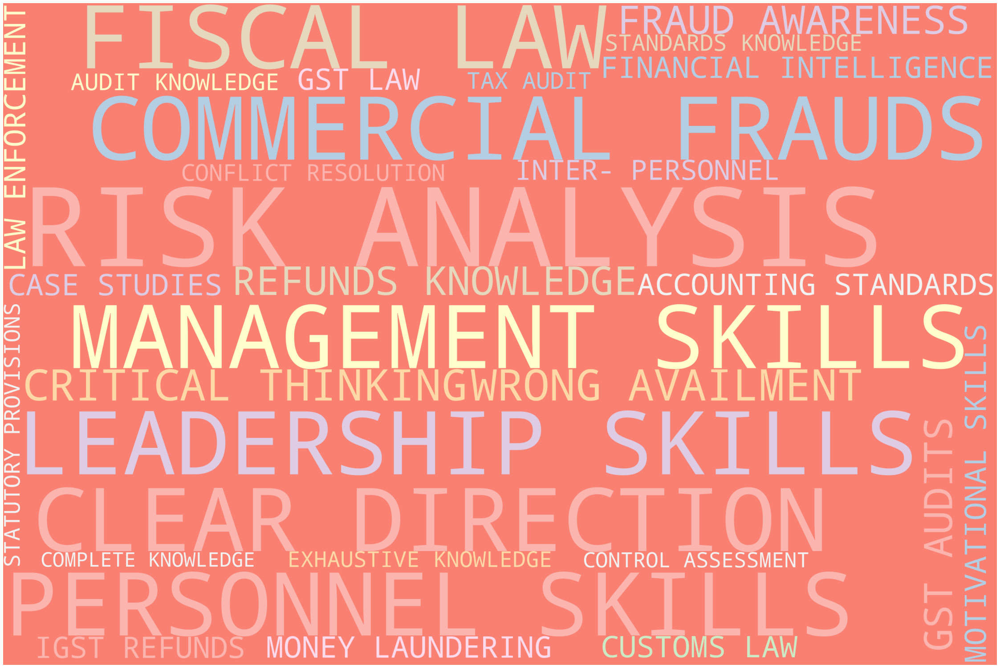

Commissioner AR , Customs, Excise and Service Tax Appellate Tribunal


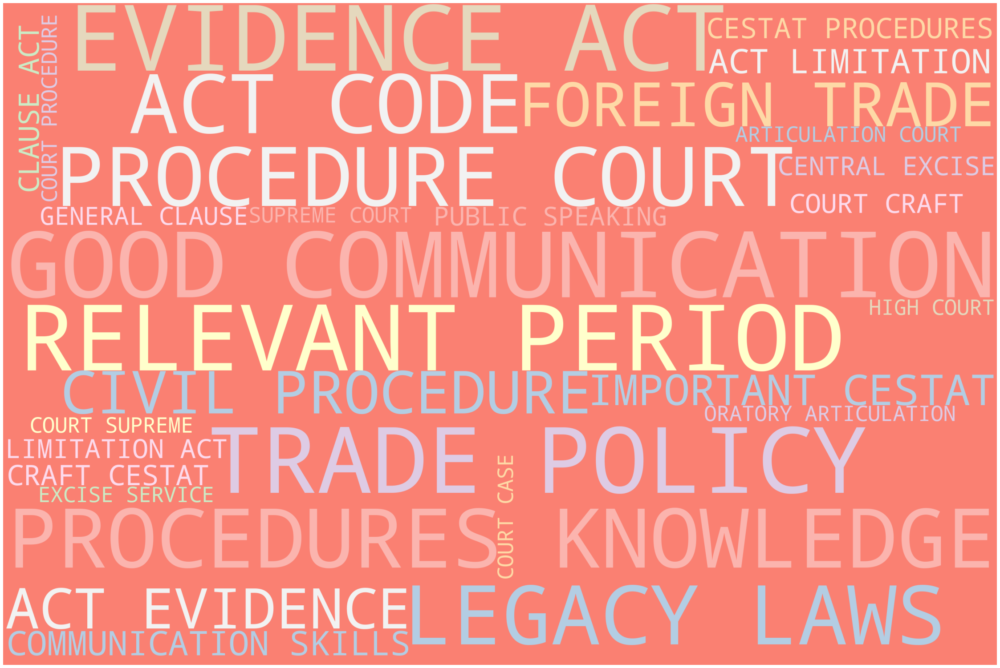

Oo The Chief Commissioner AR , Customs, Excise and Service Tax Appellate Tribunal


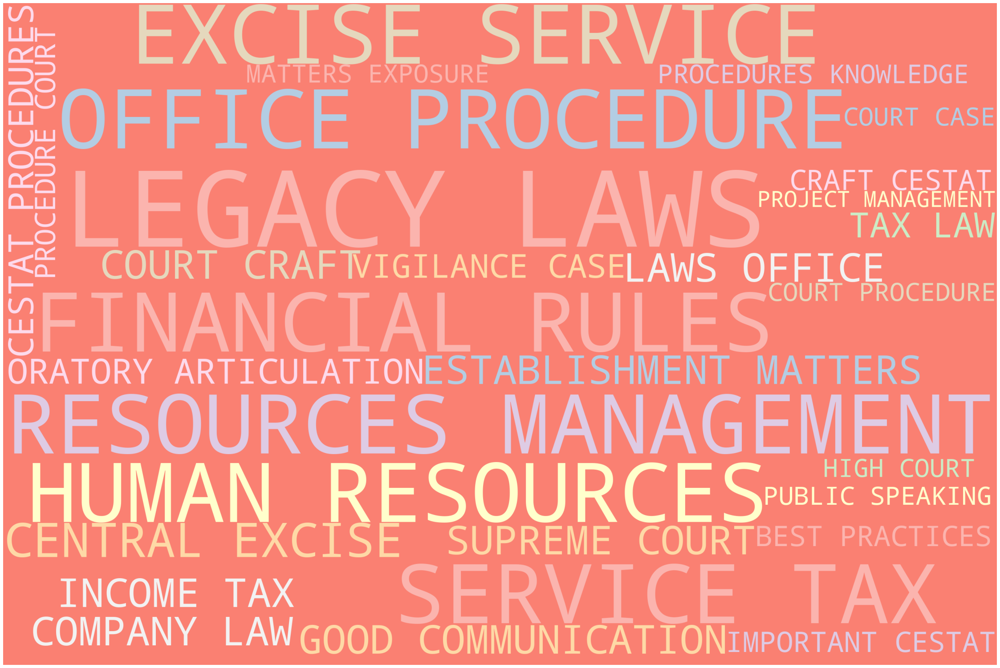

Principal Commissioner Directorate Of Legal Affairs 


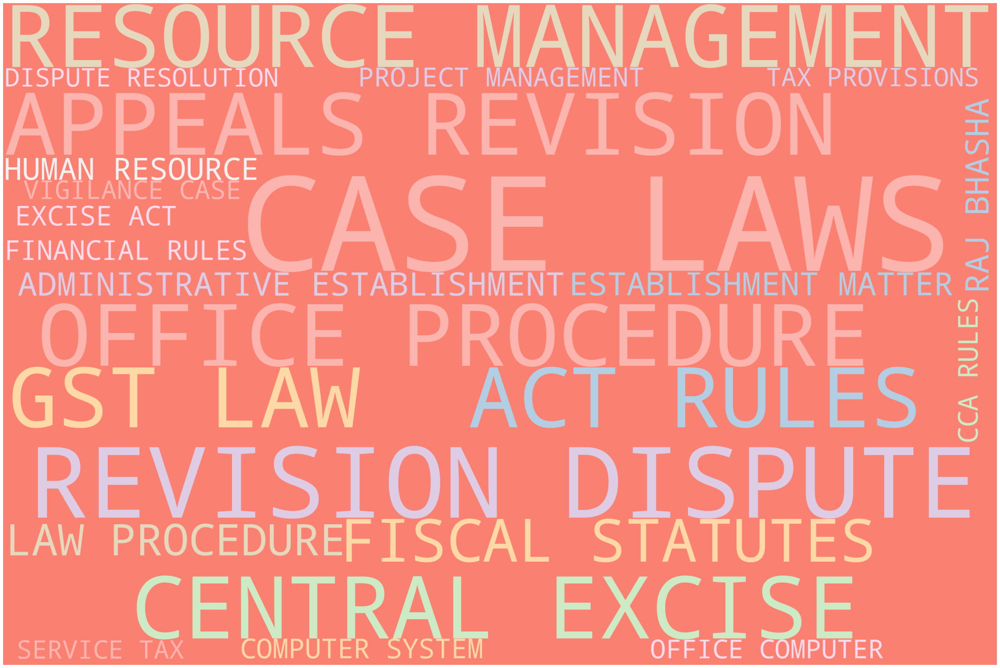

Joint CommissionerAdditional Commissioner Directorate Of Legal Affairs 


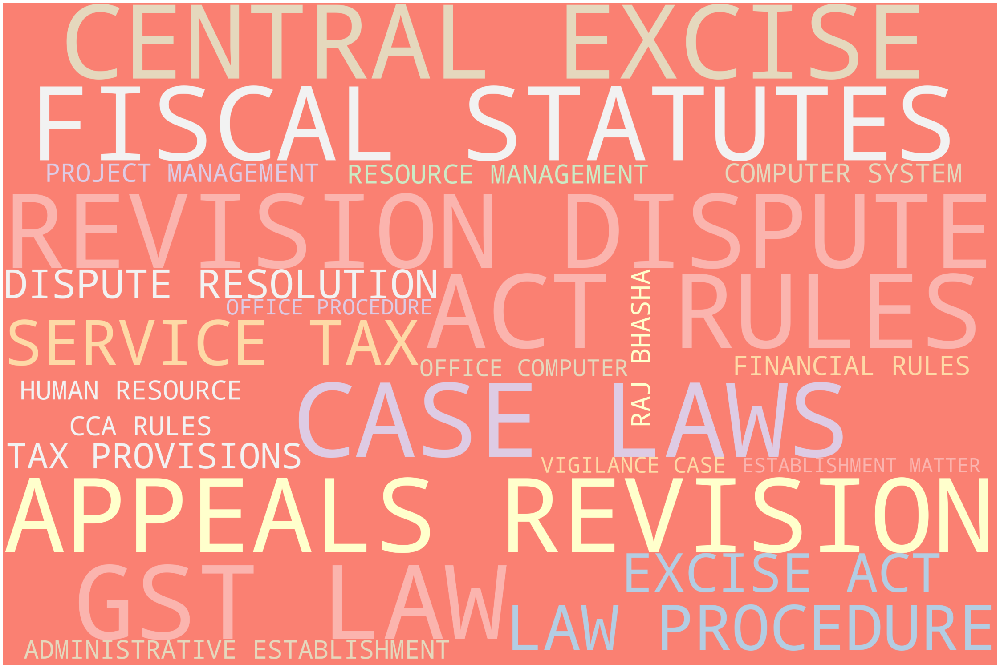

Assistant Commissioner Deputy Commissioner Directorate Of Legal Affairs 


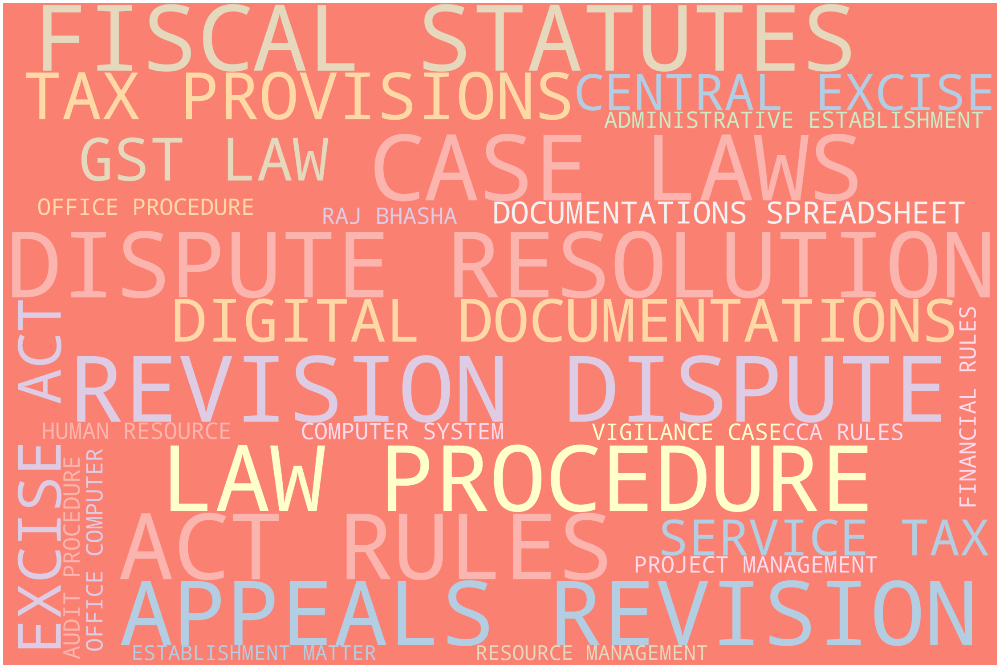

Directorate General of Goods Services Tax


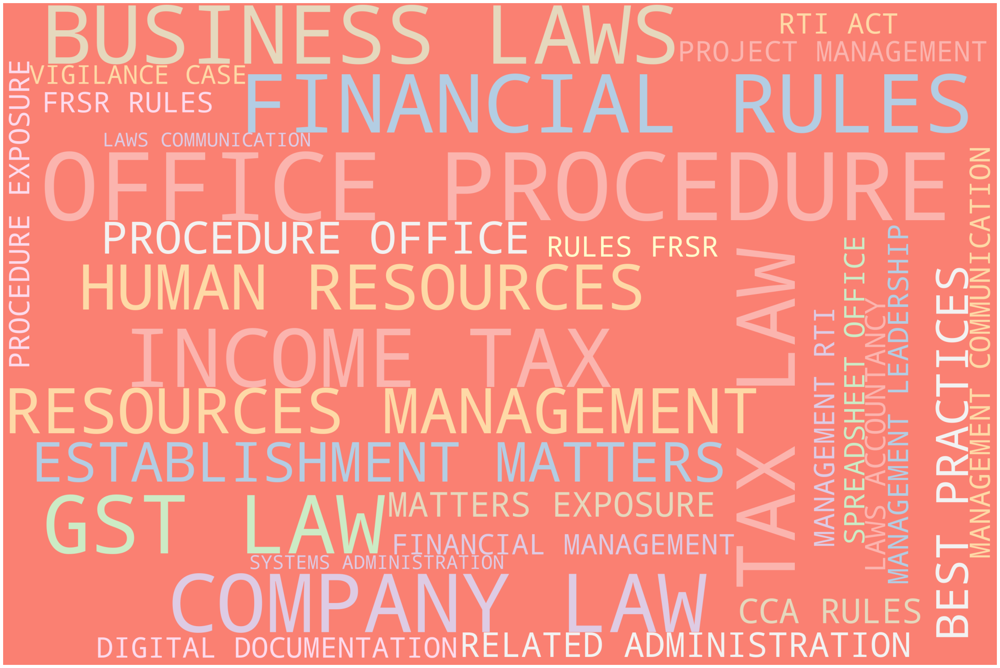

Directorate General of Performance Management


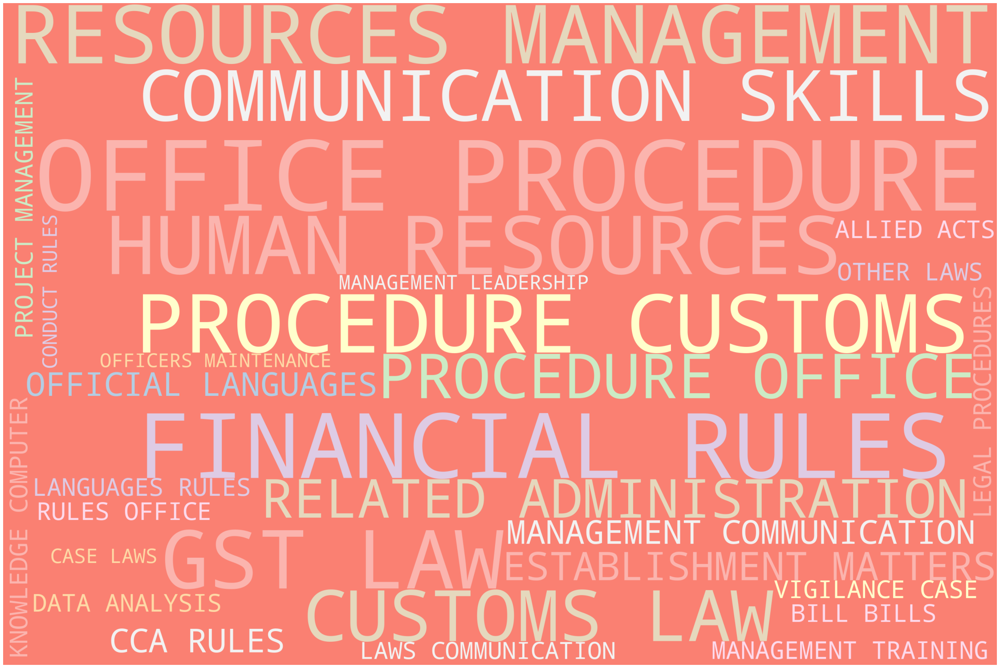

Central Bureau of Narcotics Govt Of India, Ministry of Finance, Department of Revenue


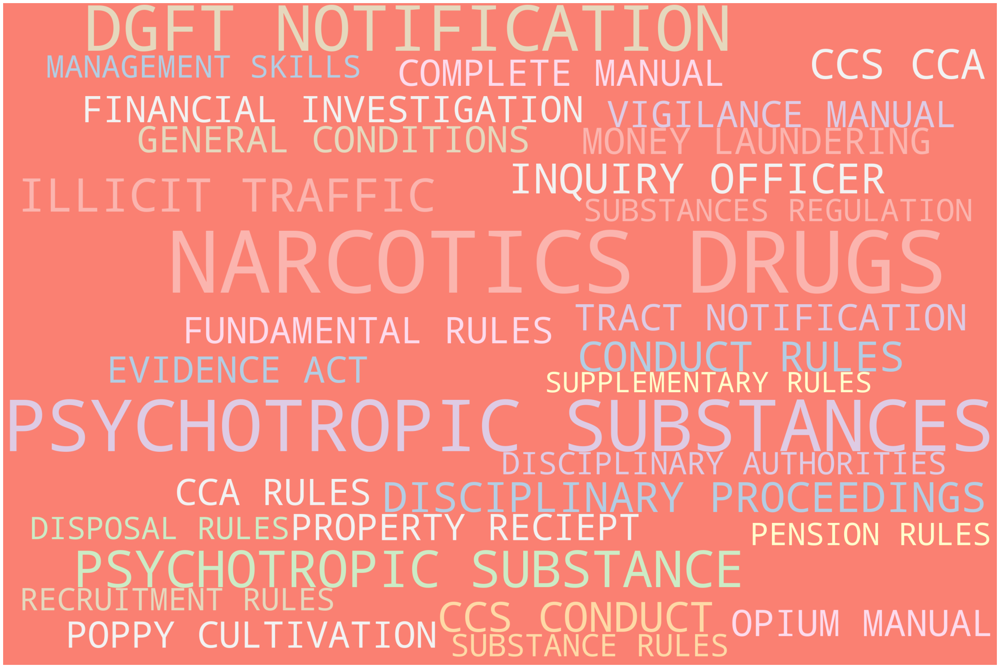

Central Revenues Control Laboratory, Govt of India, Ministry of Finance, Department of Revenue under CBIC 


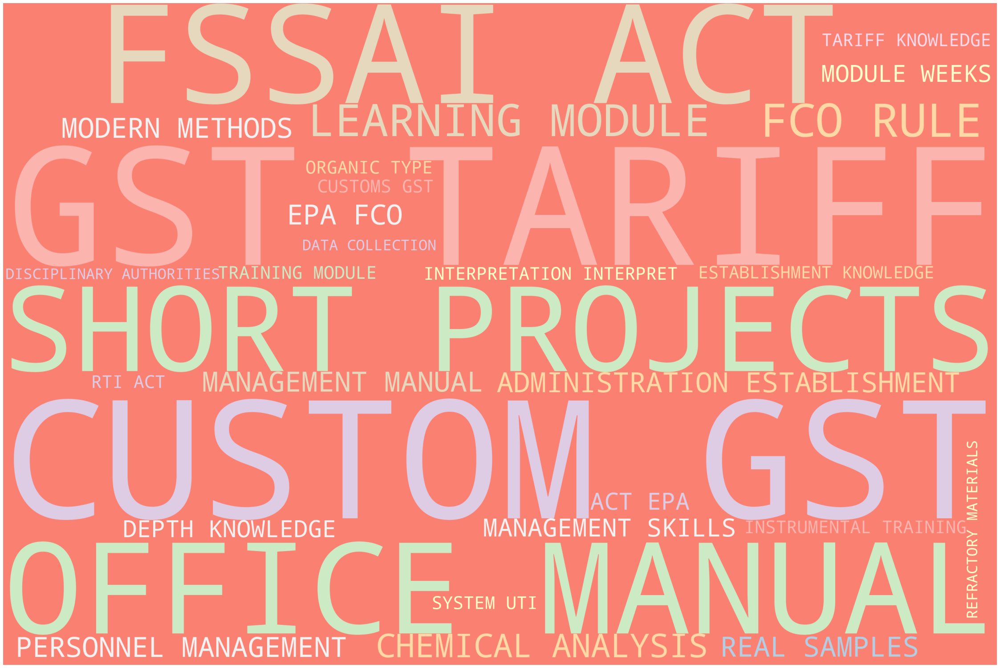

Central Revenues Control Laboratory, Govt of India, Ministry of Finance, Department of Revenue under CBIC


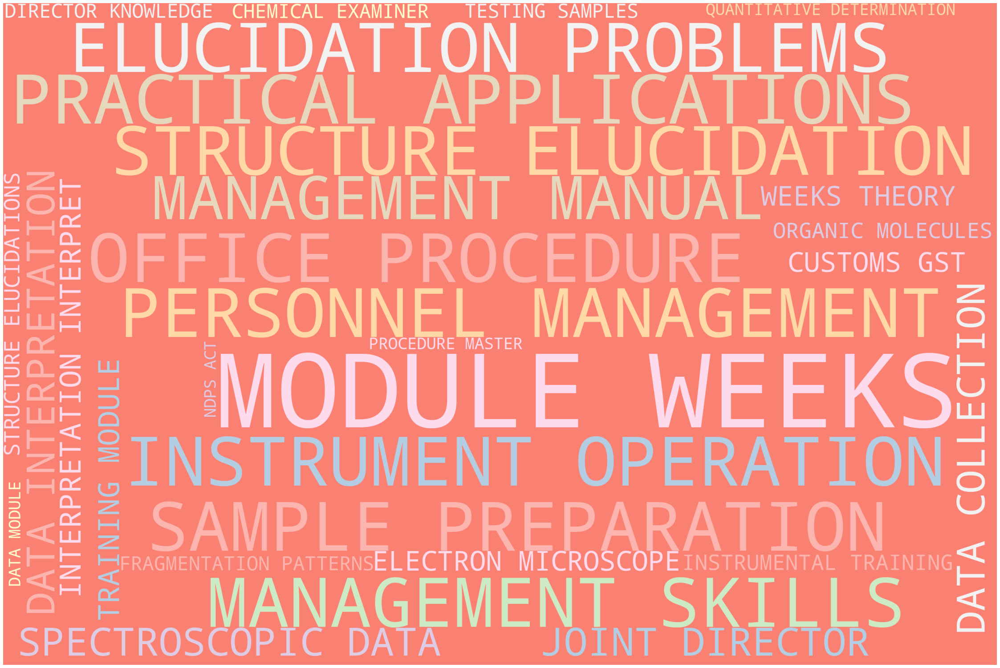

Directorate Geeral of Logistics


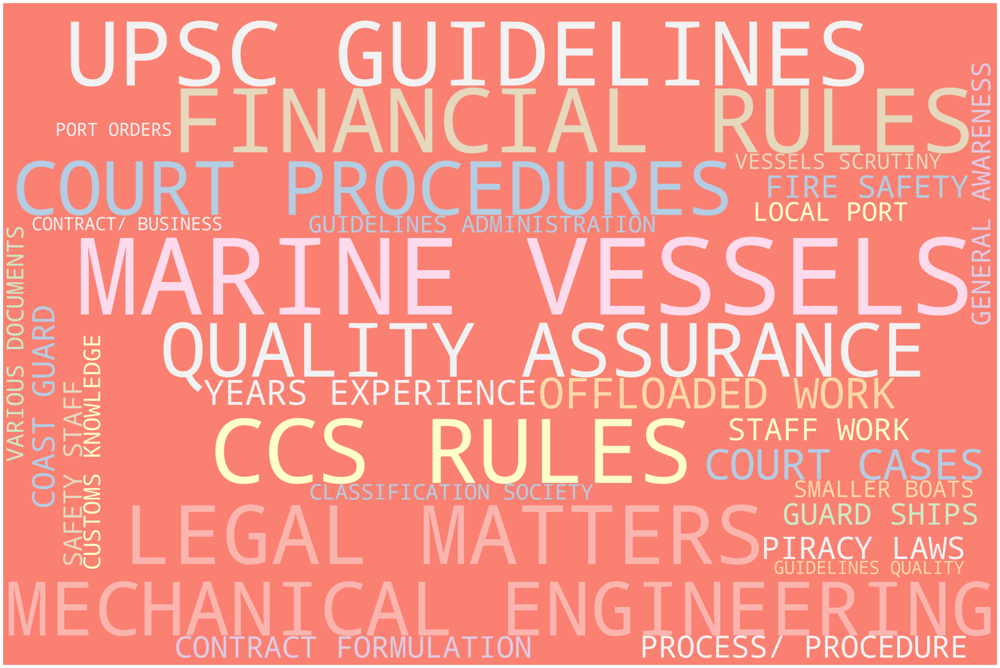

Directorate General of Anti-profiteering


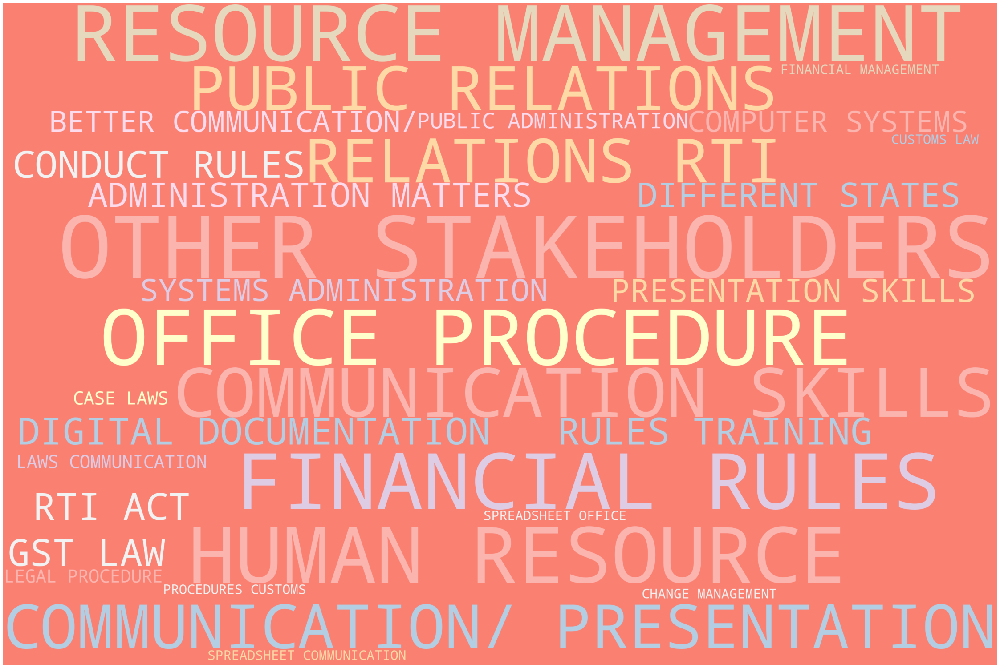

Directorate of Systems West Zonal Unit, Mumbai 


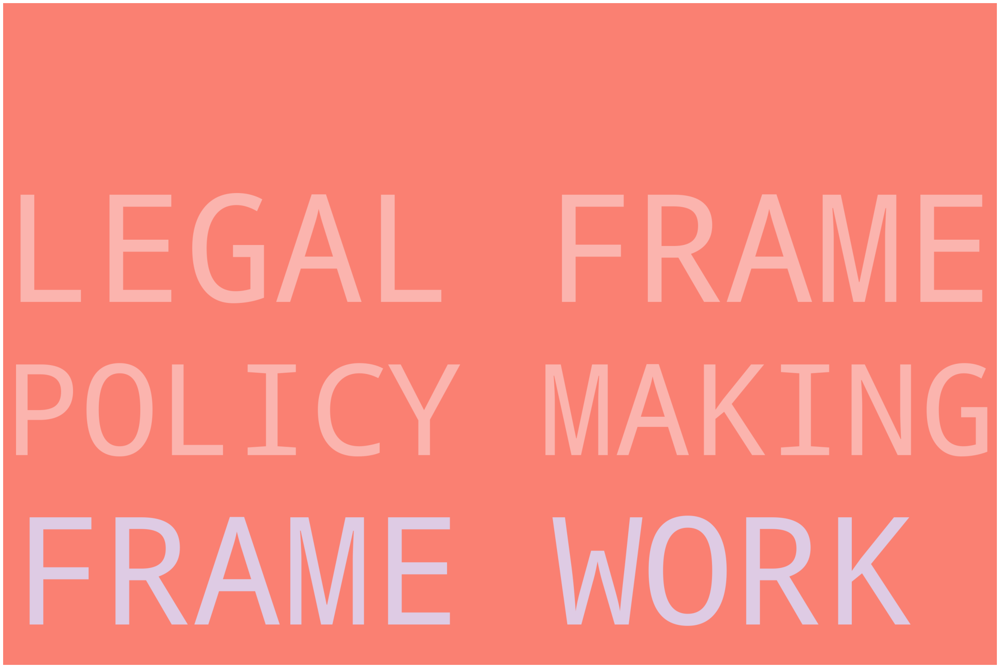

Directorate General of Valuation


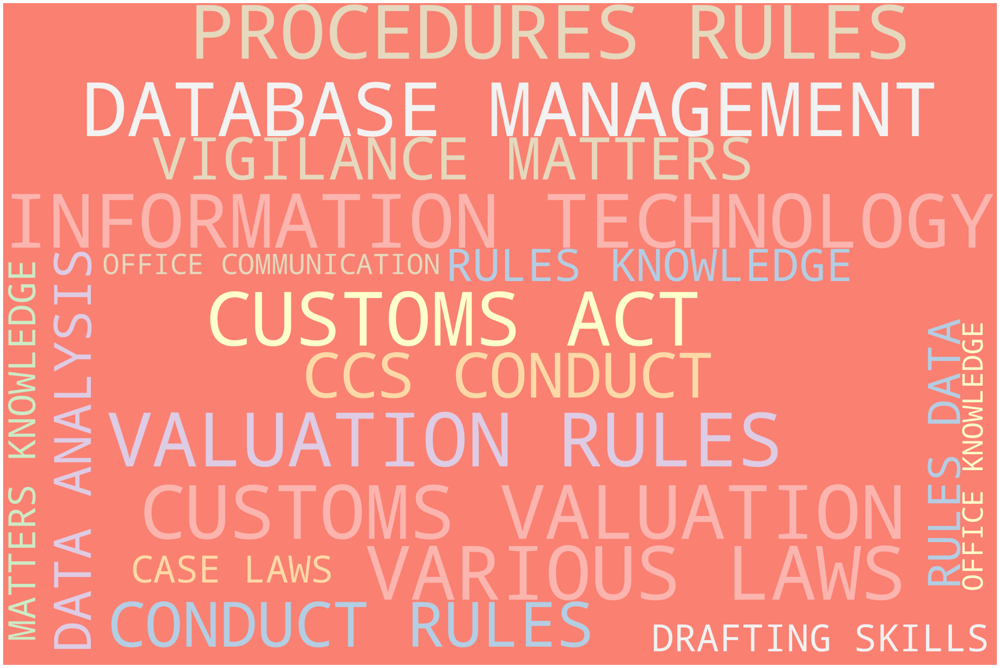

Directorate General of Vigilance


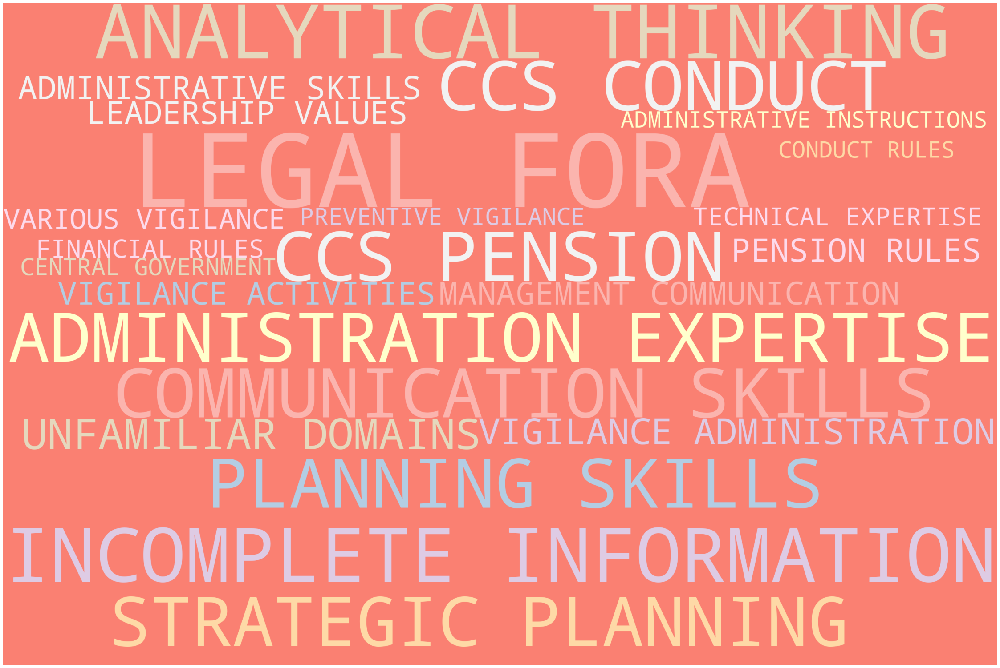

Central Excise and Service tax settlement commission


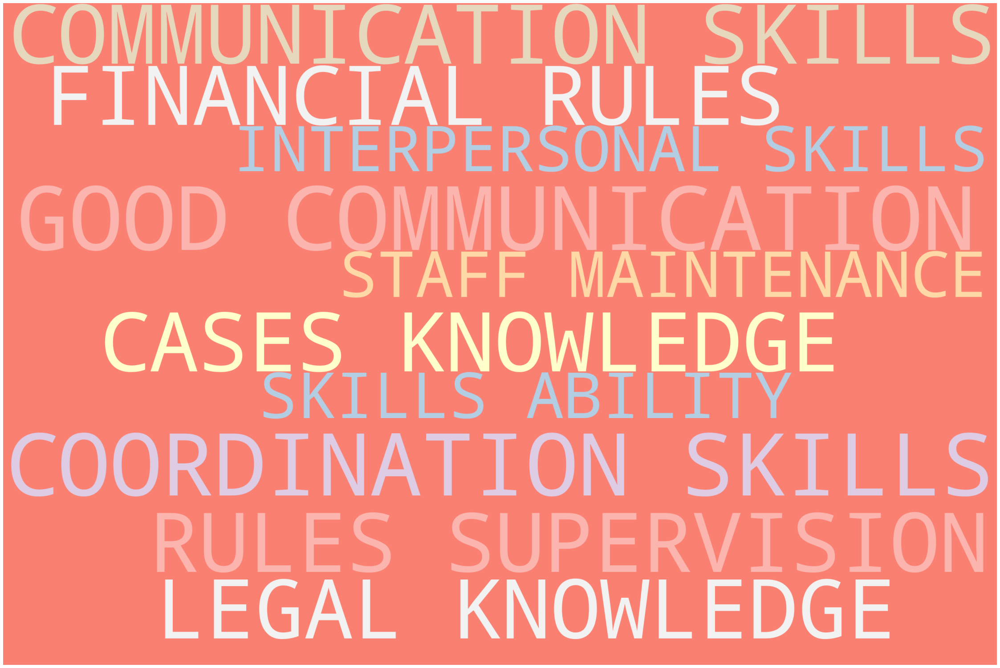

Directorate General of GST Intelligence


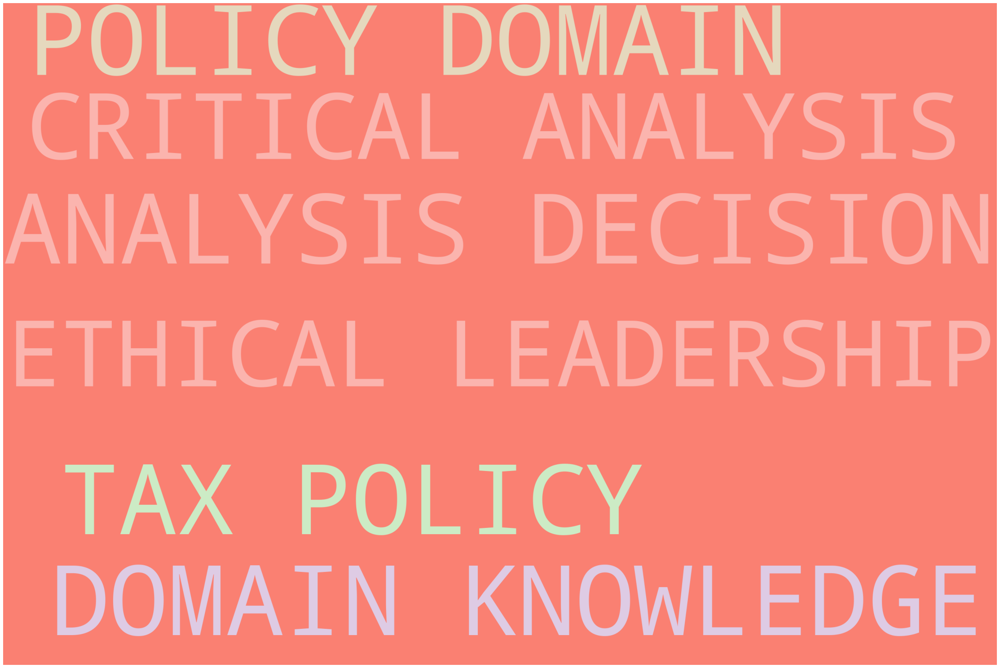

Head of Department


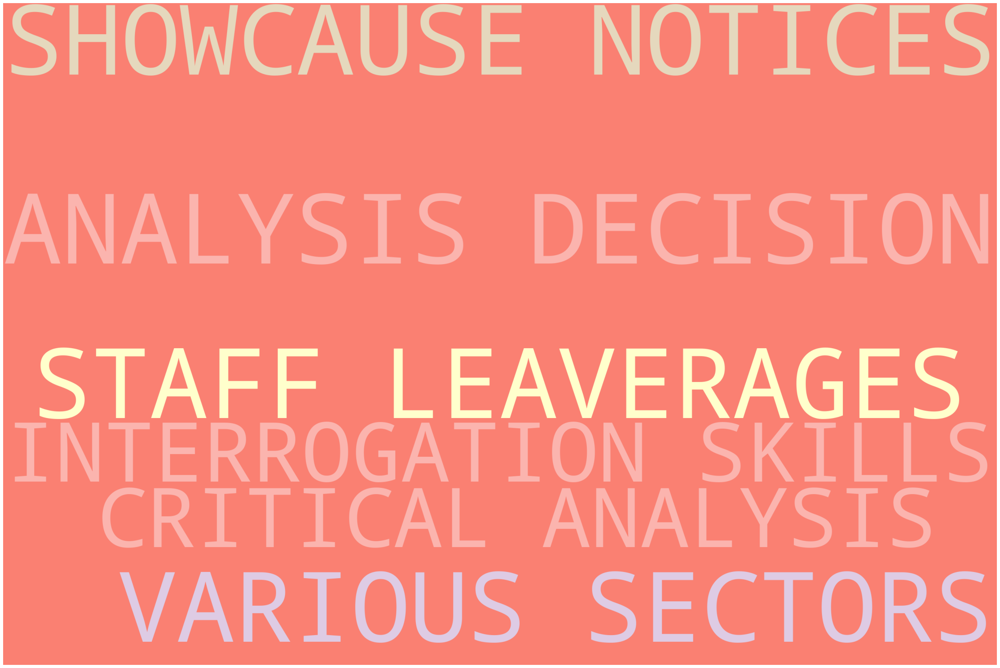

Adjudication Section


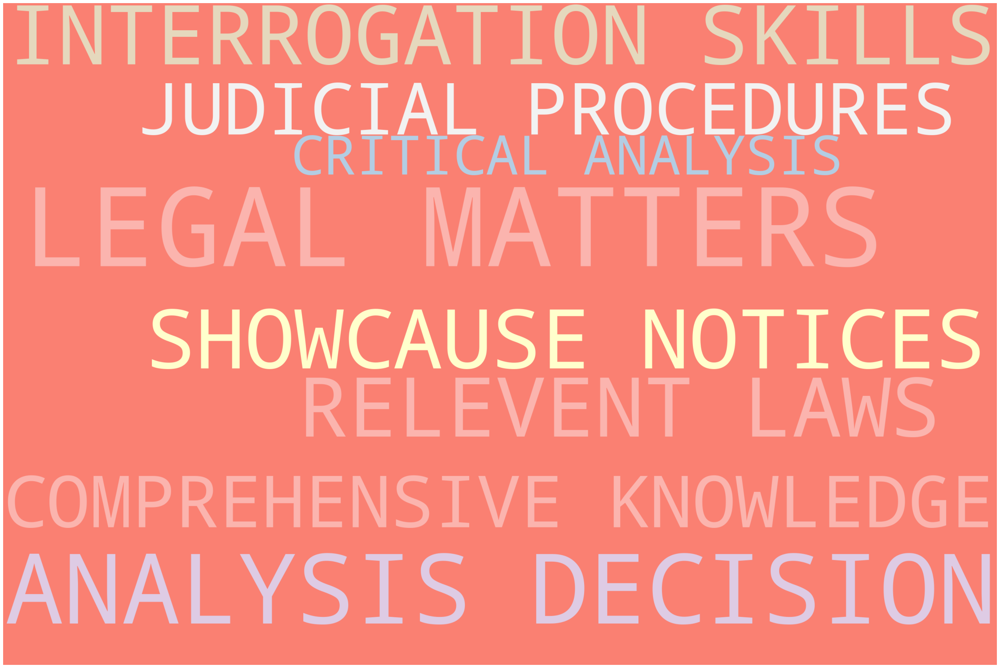

Intelligence Section


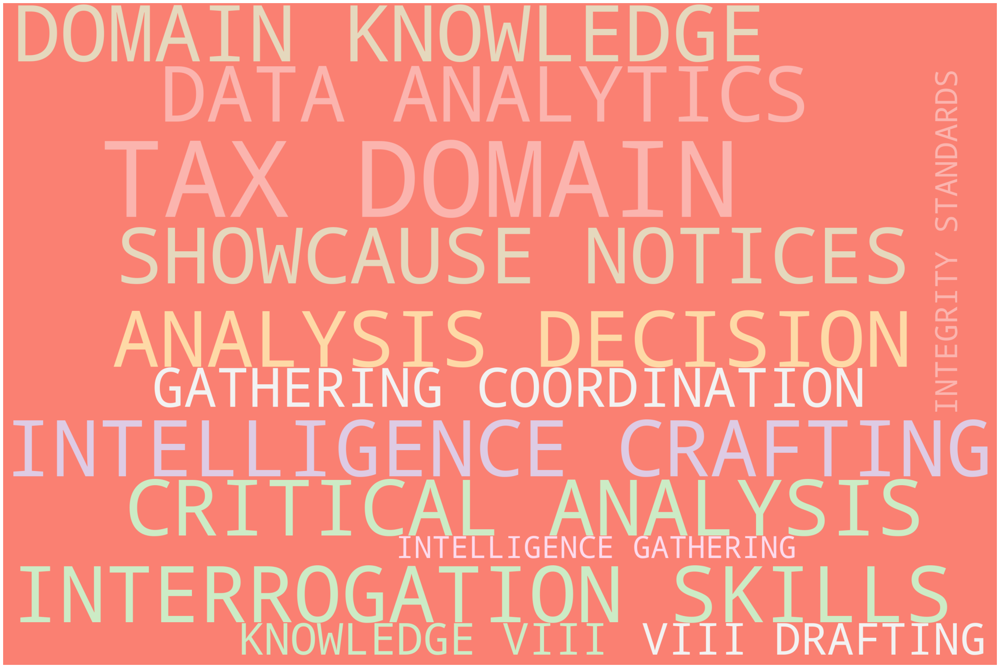

Investigation Section


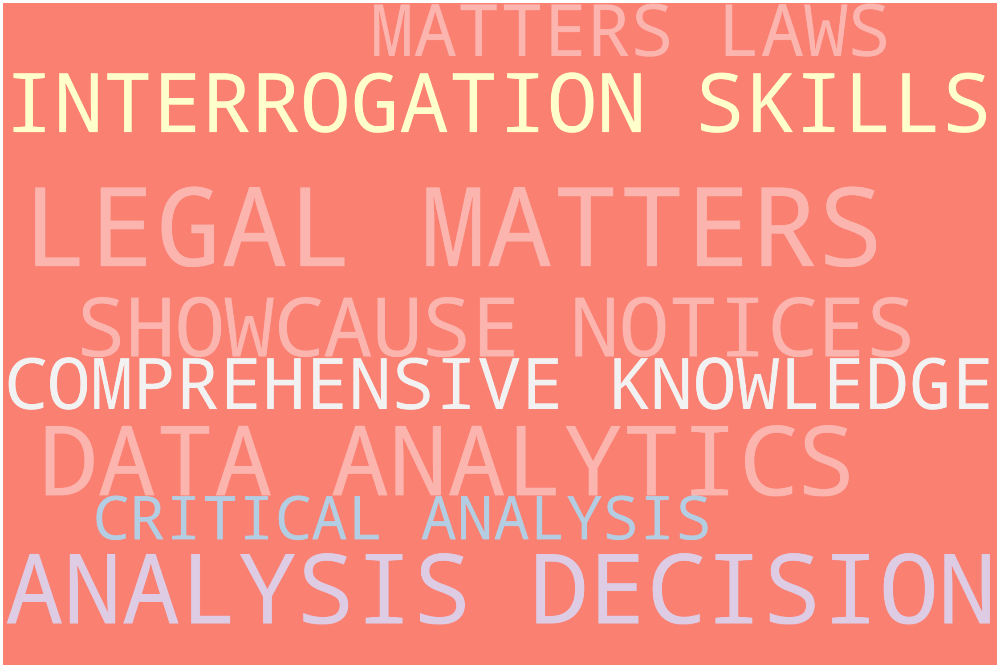

Machine Intelligence Unit


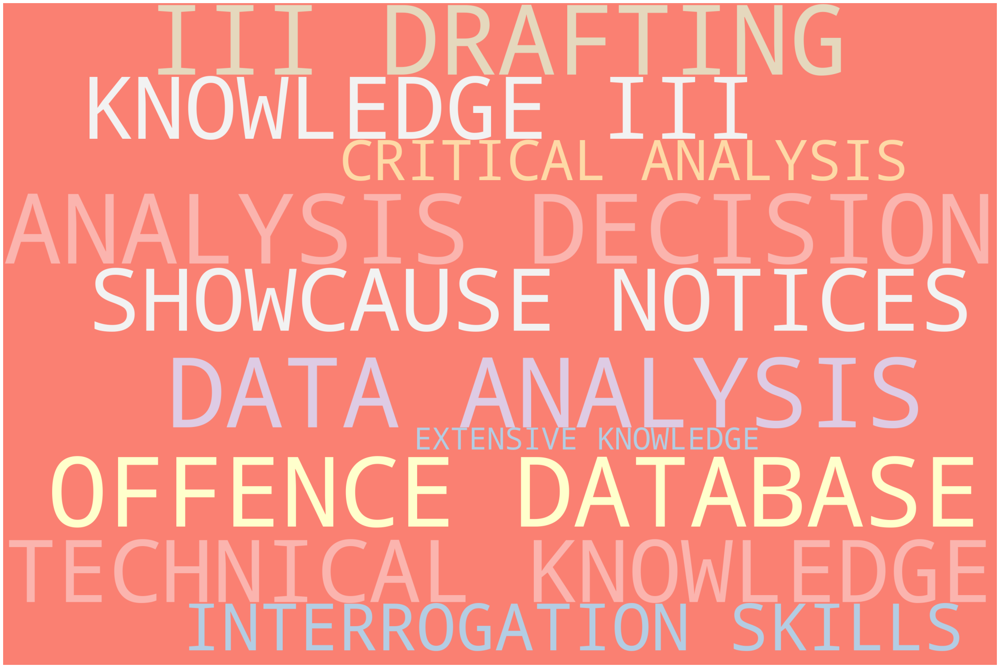

Policy Section


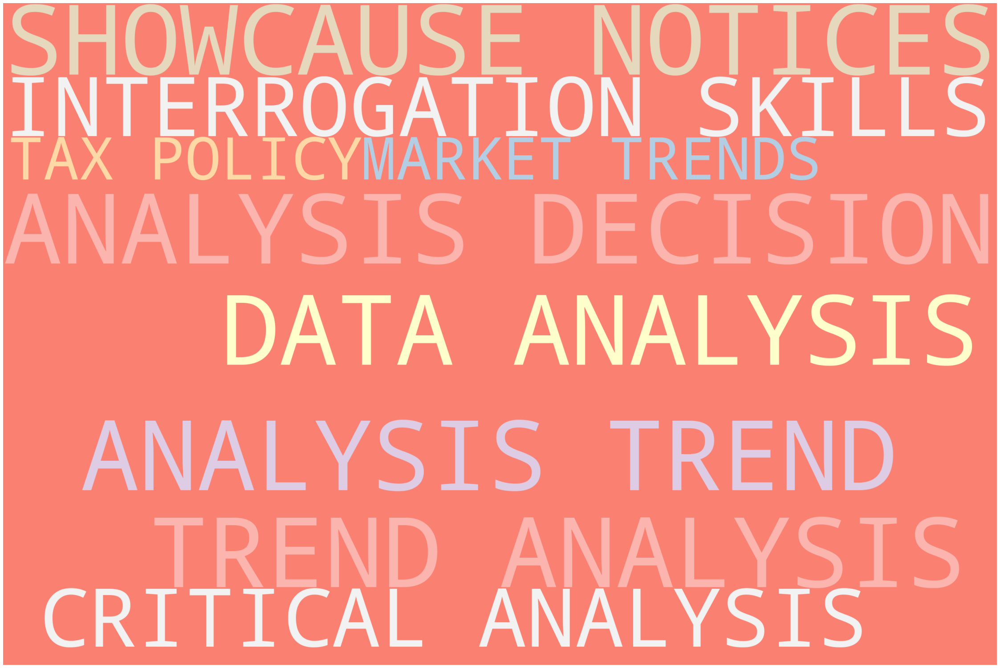

Administration Accounts Section


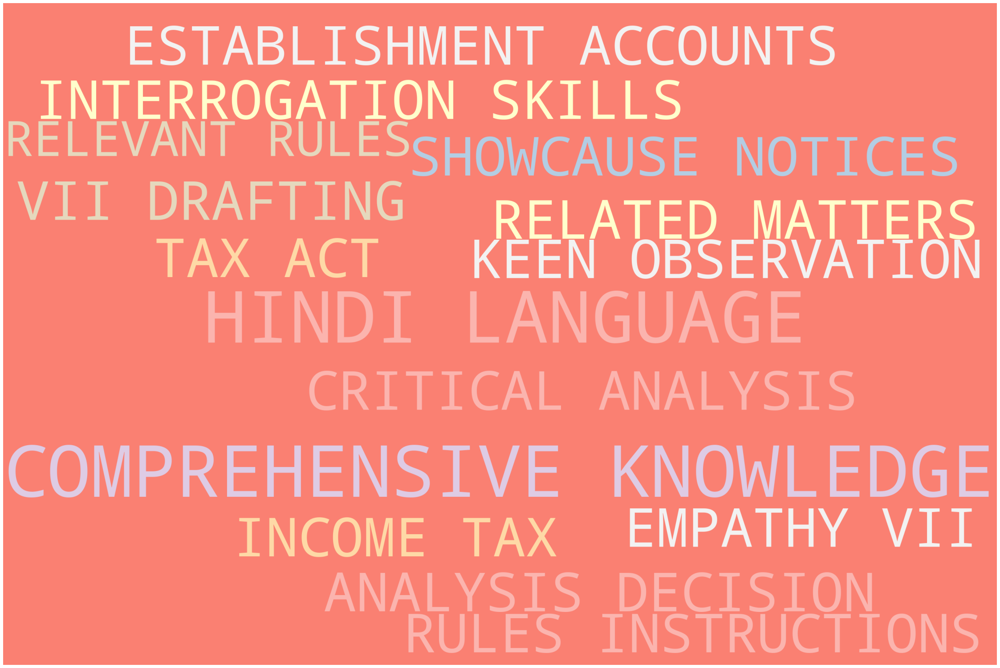

Directorate General of Export Promotion


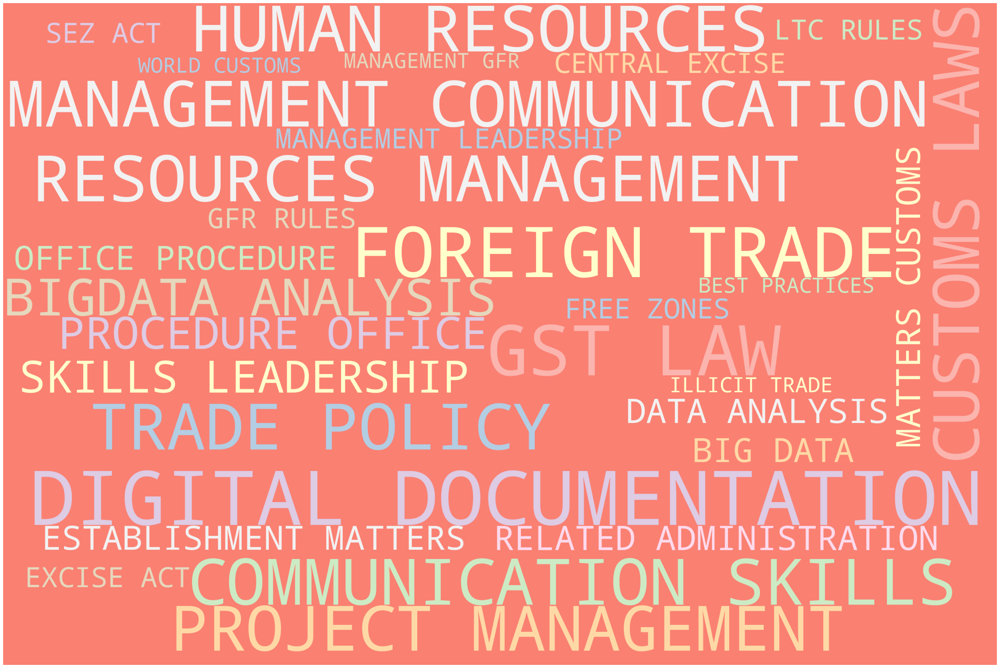

Directorate of Revenue Intelligence


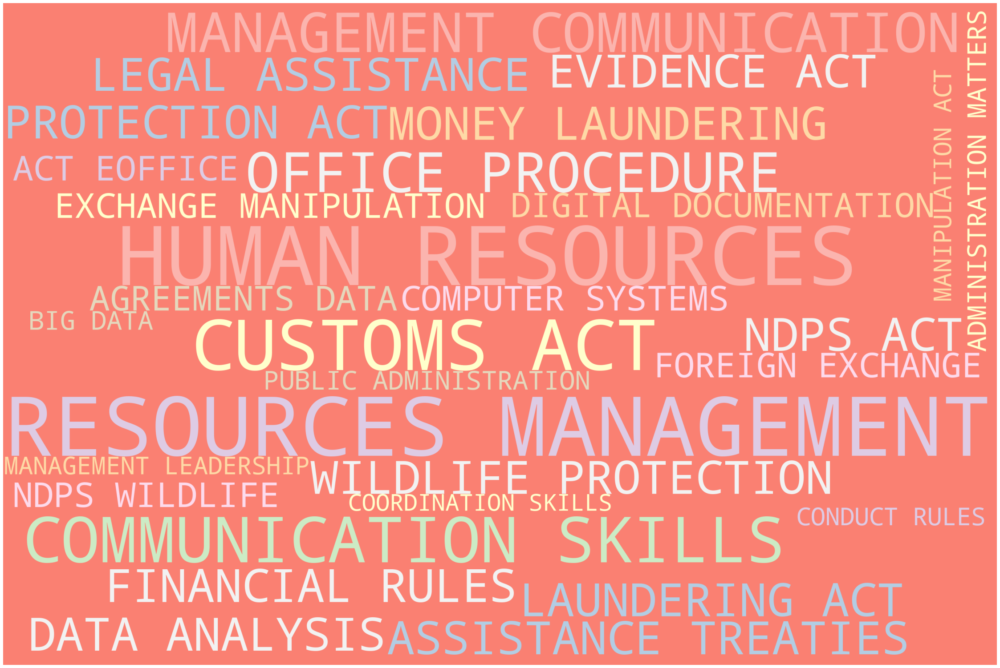

DGARM-Delhi


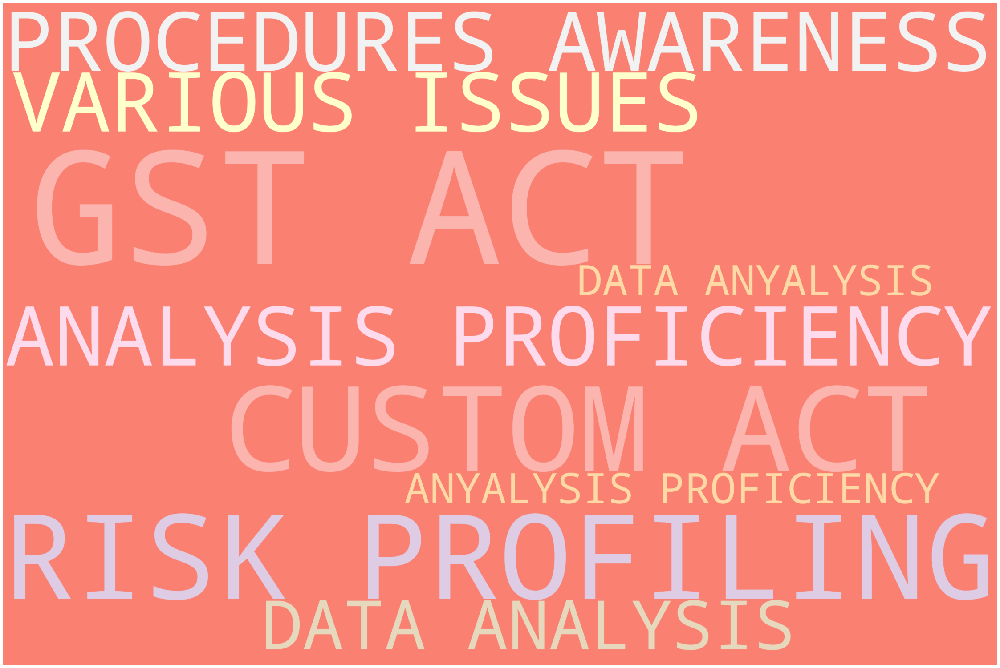

RMCC-Mumbai


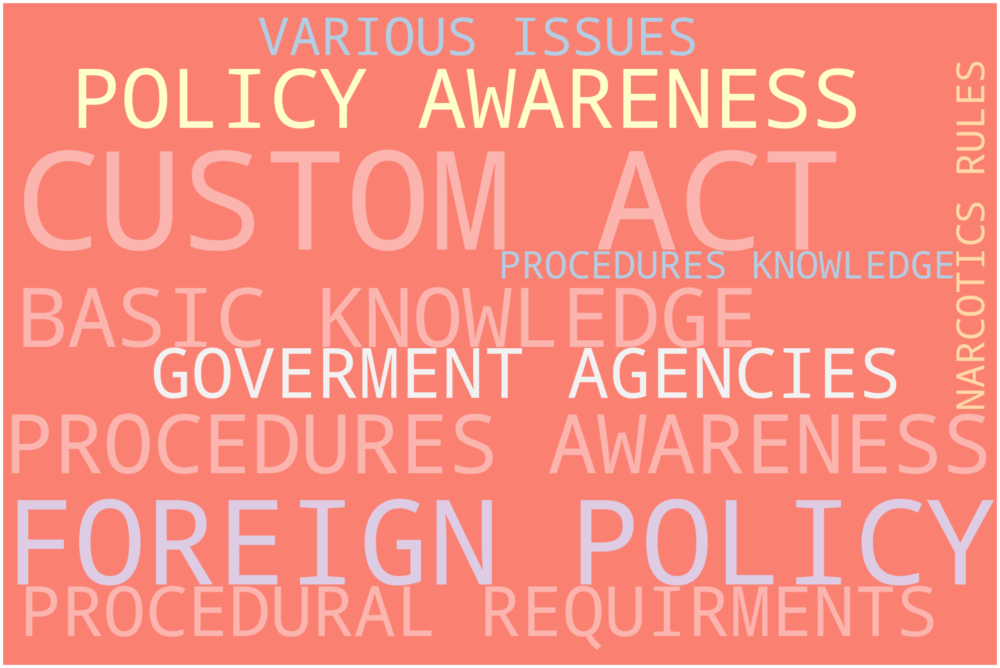

In [35]:
#Within Directorate
for directorate in combine_data.type_of_formation.unique()[1:]:
    print(clean(directorate).replace('/',""))
    generate_word_cloud(combine_data[combine_data.type_of_formation==directorate].reset_index(drop="yes"),"domain_competencies")
    plt.savefig(clean(directorate).replace('/',"")+".png")
    plt.show()
    

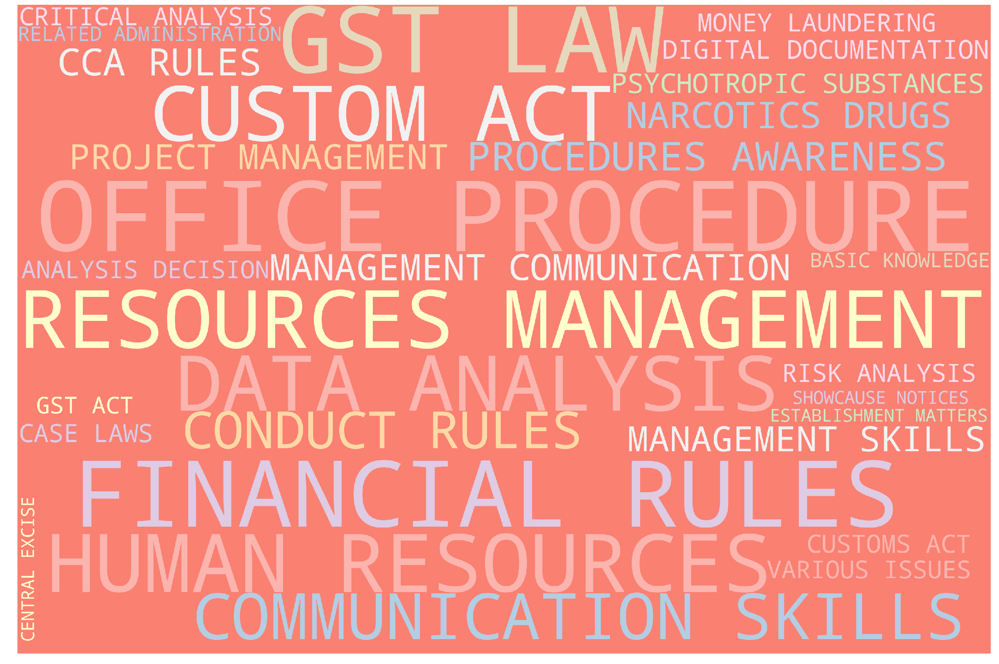

In [325]:
##Across Directorate
generate_word_cloud(combine_data,"domain_competencies")
plt.savefig("Across Directorate.png")

In [105]:
pd.Series(clean_text).value_counts()[:30].to_dict()

{'RISK ANALYSIS': 7,
 'WRONG AVAILMENT': 4,
 'CUSTOMS LAW': 4,
 'REFUNDS KNOWLEDGE': 4,
 'FRAUD AWARENESS': 4,
 'MONEY LAUNDERING': 4,
 'PERSONNEL SKILLS': 4,
 'GST LAW': 4,
 'IGST REFUNDS': 4,
 'ACCOUNTING STANDARDS': 4,
 'GST AUDITS': 4,
 'FISCAL LAW': 4,
 'LAW ENFORCEMENT': 4,
 'MANAGEMENT SKILLS': 4,
 'COMMERCIAL FRAUDS': 4,
 'FINANCIAL INTELLIGENCE': 4,
 'CASE STUDIES': 4,
 'CLEAR DIRECTION': 3,
 'COMPLETE KNOWLEDGE': 3,
 'MOTIVATIONAL SKILLS': 3,
 'INTERNAL CONTROL': 3,
 'COMPREHENSIVE KNOWLEDGE': 3,
 'EXHAUSTIVE KNOWLEDGE': 3,
 'CONFLICT RESOLUTION': 3,
 'STANDARDS KNOWLEDGE': 3,
 'CONTROL ASSESSMENT': 3,
 'CRITICAL THINKING': 3,
 'RESOLUTION LEADERSHIP': 3,
 'RISK MANAGEMENT': 3,
 'LEADERSHIP SKILLS': 3}

# WIP

In [108]:
import numpy as np
import seaborn as sns
from apyori import apriori

In [118]:
amd=[]
input_text=" ".join(remove_stopwords([clean(str(text).lower()) for text in list(combine_data.domain_competencies) if len(str(text))>2 or str(text).lower() not in ["and","of"]]))

# input_text=clean(input_text)
# for raw in combine_data.domain_competencies:
#     amd.append(remove_stopwords(clean(raw).split(" ")))


In [121]:
for directorate in combine_data.type_of_formation.unique()[:1]:
    print(directorate)
    combine_data[combine_data.type_of_formation==directorate].reset_index(drop="yes")["domain_competencies"]
    

Directorate General of Audit, Headquarters, New Delhi


In [125]:
sent_text=""
for sentence in combine_data[combine_data.type_of_formation==directorate].reset_index(drop="yes")["domain_competencies"]:
    sent_text=sent_text+" "+str(sentence)


In [132]:
pd.DataFrame(combine_data.type_of_formation.unique(),columns=['directorate'])

,directorate
0,"Directorate General of Audit, Headquarters, Ne..."
1,Directorate General of Audit Zonal Unit
2,"Commissioner (AR), Customs, Excise and Service..."
3,"O/o The Chief Commissioner (AR), Customs, Exci..."
4,Principal Commissioner (Directorate Of Legal A...
5,Joint Commissioner/Additional Commissioner (Di...
6,Assistant Commissioner/ Deputy Commissioner (D...
7,Directorate General of Goods & Services Tax
8,Directorate General of Performance Management
9,"Central Bureau of Narcotics Govt. Of India, Mi..."


In [193]:
def clean_dataframe(dataframe,directorate_column,competencies_column):
#     combine_data=dataframe.copy()
    
    clean_combine_data=pd.DataFrame(dataframe[directorate_column].unique(),columns=["directorate"])

#     clean_sent=[]
    column="domain_competencies"
    def clean_sentence(directorate):
        sent_text=""
        for sentence in dataframe[dataframe[directorate_column]==directorate].reset_index(drop="yes")[competencies_column]:
            sent_text=sent_text+" "+str(sentence)
        sent_text=clean(sent_text).replace(" / "," ").replace(",","")
        stop_words_for_mba=["and","of","i e","in","along","with"]
        return(" ".join([str(sent).lower() for sent in sent_text.split(" ") if str(sent).lower() not in stop_words_for_mba and len(str(sent))>3]))
    clean_combine_data["cleaned_sentence"]=clean_combine_data.directorate.apply(lambda x: clean_sentence(x))
    clean_combine_data.directorate=clean_combine_data.directorate.apply(lambda x:str(x).replace(",",""))
    input_text=pos([clean(str(text).lower()) for text in clean_combine_data["cleaned_sentence"]])
    clean_text=[]
    for sentence in input_text:
        sent_clean=[]
        for pair in sentence:
    #         print(pair)
            if pair[1] in ["NOUN","PROPN"] and len(pair[0])>2:
                if sentence.index(pair)>0:
    #                 print(sentence.index(pair))
                    if sentence[sentence.index(pair)-1][1] in ["ADJ","NOUN","PROPN"] and len(sentence[sentence.index(pair)-1][0])>2:

                        combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                        stop_word_list=["STUDIES KNOWLEDGE","GOOD KNOWLEGE","ANALYSIS KNOWLEDGE"]
                        if combine_text.upper() not in stop_word_list:
                            sent_clean.append(combine_text.upper())
        sent_clean.append(clean_combine_data.directorate[input_text.index(sentence)])
        clean_text.append(sent_clean)
    clean_combine_data["cleaned_sentence_asso"]=clean_text
    return(clean_combine_data)

In [194]:
clean_combine_data=clean_dataframe(combine_data,"type_of_formation","domain_competencies")

In [220]:
clean_combine_data.cleaned_sentence_asso[0]

['COMPREHENSIVE KNOWLEDGE',
 'KNOWLEDGE PROCEDURE',
 'COMPLETE KNOWLEDGE',
 'KNOWLEDGE CUSTOMS',
 'EXHAUSTIVE KNOWLEDGE',
 'KNOWLEDGE AUDITS',
 'AUDITS CASE',
 'CASE STUDIES',
 'KNOWLEDGE RISK',
 'RISK ANALYSIS',
 'FINANCIAL INTELLIGENCE',
 'FISCAL ENFORCEMENT',
 'ENFORCEMENT TRADE',
 'MONEY LAUNDERING',
 'LAUNDERING PREVENTION',
 'COMMERCIAL FRAUDS',
 'FRAUDS EVASION',
 'WRONG AVAILMENT',
 'AVAILMENT ITC',
 'IGST REFUNDS',
 'REFUNDS KNOWLEDGE',
 'KNOWLEDGE AUDITING',
 'AUDITING FRAUD',
 'FRAUD AWARENESS',
 'AWARENESS ACCOUNTING',
 'ACCOUNTING STANDARDS',
 'STANDARDS KNOWLEDGE',
 'KNOWLEDGE RISK',
 'RISK MANAGEMENT',
 'MANAGEMENT RISK',
 'RISK ANALYSIS',
 'INTERNAL CONTROL',
 'CONTROL ASSESSMENT',
 'PERSONNEL SKILLS',
 'SKILLS MANAGEMENT',
 'MANAGEMENT SKILLS',
 'CRITICAL THINKING',
 'THINKING TEAMWORK',
 'TEAMWORK CONFLICT',
 'CONFLICT RESOLUTION',
 'RESOLUTION LEADERSHIP',
 'MOTIVATIONAL SKILLS',
 'CLEAR DIRECTION',
 'COMPREHENSIVE KNOWLEDGE',
 'KNOWLEDGE PROCEDURE',
 'COMPLETE KNOWL

In [178]:
input_text=pos([clean(str(text).lower()) for text in clean_combine_data["cleaned_sentence"]])
clean_text=[]
for sentence in input_text:
    sent_clean=[]
    for pair in sentence:
#         print(pair)
        if pair[1] in ["NOUN","PROPN"] and len(pair[0])>2:
            if sentence.index(pair)>0:
#                 print(sentence.index(pair))
                if sentence[sentence.index(pair)-1][1] in ["ADJ","NOUN","PROPN"] and len(sentence[sentence.index(pair)-1][0])>2:

                    combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                    stop_word_list=["STUDIES KNOWLEDGE","GOOD KNOWLEGE","ANALYSIS KNOWLEDGE"]
                    if combine_text.upper() not in stop_word_list:
                        sent_clean.append(combine_text.upper())
    clean_text.append(sent_clean)

In [183]:
clean_combine_data["cleaned_sentence_asso"]=clean_text

In [186]:
clean_combine_data.directorate=clean_combine_data.directorate.apply(lambda x:str(x).replace(",",""))

In [287]:
def clean_dataframe(dataframe,directorate_column,competencies_column):
#     combine_data=dataframe.copy()
    
    clean_combine_data=pd.DataFrame(dataframe[directorate_column].unique(),columns=["directorate"])
    daf=pd.DataFrame()
#     clean_sent=[]
    column="domain_competencies"
    def clean_sentence(directorate):
        sent_text=""
        for sentence in dataframe[dataframe[directorate_column]==directorate].reset_index(drop="yes")[competencies_column]:
            sent_text=sent_text+" "+str(sentence)
        sent_text=clean(sent_text).replace(" / "," ").replace(",","")
        stop_words_for_mba=["and","of","i e","in","along","with"]
        return(" ".join([str(sent).lower() for sent in sent_text.split(" ") if str(sent).lower() not in stop_words_for_mba and len(str(sent))>3]))
    clean_combine_data["cleaned_sentence"]=clean_combine_data.directorate.apply(lambda x: clean_sentence(x))
    clean_combine_data.directorate=clean_combine_data.directorate.apply(lambda x:str(x).replace(",",""))
    input_text=pos([clean(str(text).lower()) for text in clean_combine_data["cleaned_sentence"]])
    clean_text=[]
    for sentence in input_text:
        sent_clean=[]
        df=pd.DataFrame()
        for pair in sentence:
    #         print(pair)
            if pair[1] in ["NOUN","PROPN"] and len(pair[0])>2:
                if sentence.index(pair)>0:
    #                 print(sentence.index(pair))
                    if sentence[sentence.index(pair)-1][1] in ["ADJ","NOUN","PROPN"] and len(sentence[sentence.index(pair)-1][0])>2:

                        combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                        stop_word_list=["STUDIES KNOWLEDGE","GOOD KNOWLEGE","ANALYSIS KNOWLEDGE"]
                        if combine_text.upper() not in stop_word_list:
                            sent_clean.append(combine_text.upper())
        df["skill"]=sent_clean
        df["directorate"]=clean_combine_data.directorate[input_text.index(sentence)]
        daf=daf.append(df)
        sent_clean.append(clean_combine_data.directorate[input_text.index(sentence)])
        clean_text.append(sent_clean)
    clean_combine_data["cleaned_sentence_asso"]=clean_text
    daf=daf.reset_index(drop="yes")
    return(clean_combine_data,daf)

In [288]:
clean_combine_data,daf=clean_dataframe(combine_data,"type_of_formation","domain_competencies")

In [216]:
clean_combine_data.cleaned_sentence_asso[0]

['COMPREHENSIVE KNOWLEDGE',
 'KNOWLEDGE PROCEDURE',
 'COMPLETE KNOWLEDGE',
 'KNOWLEDGE CUSTOMS',
 'EXHAUSTIVE KNOWLEDGE',
 'KNOWLEDGE AUDITS',
 'AUDITS CASE',
 'CASE STUDIES',
 'KNOWLEDGE RISK',
 'RISK ANALYSIS',
 'FINANCIAL INTELLIGENCE',
 'FISCAL ENFORCEMENT',
 'ENFORCEMENT TRADE',
 'MONEY LAUNDERING',
 'LAUNDERING PREVENTION',
 'COMMERCIAL FRAUDS',
 'FRAUDS EVASION',
 'WRONG AVAILMENT',
 'AVAILMENT ITC',
 'IGST REFUNDS',
 'REFUNDS KNOWLEDGE',
 'KNOWLEDGE AUDITING',
 'AUDITING FRAUD',
 'FRAUD AWARENESS',
 'AWARENESS ACCOUNTING',
 'ACCOUNTING STANDARDS',
 'STANDARDS KNOWLEDGE',
 'KNOWLEDGE RISK',
 'RISK MANAGEMENT',
 'MANAGEMENT RISK',
 'RISK ANALYSIS',
 'INTERNAL CONTROL',
 'CONTROL ASSESSMENT',
 'PERSONNEL SKILLS',
 'SKILLS MANAGEMENT',
 'MANAGEMENT SKILLS',
 'CRITICAL THINKING',
 'THINKING TEAMWORK',
 'TEAMWORK CONFLICT',
 'CONFLICT RESOLUTION',
 'RESOLUTION LEADERSHIP',
 'MOTIVATIONAL SKILLS',
 'CLEAR DIRECTION',
 'COMPREHENSIVE KNOWLEDGE',
 'KNOWLEDGE PROCEDURE',
 'COMPLETE KNOWL

In [158]:
asso_data=clean_combine_data.groupby([clean_combine_data.directorate])["cleaned_sentence"].apply(list).values.tolist()

In [197]:
asso_data=list(clean_combine_data.cleaned_sentence_asso)

In [198]:
# asso = apriori(asso_data, min_support=0.005, min_confidence=0.5, min_lift=2)

In [312]:
def association(text,min_support=0.01,max_length = 2):
    from apyori import apriori
    import pandas as pd
    global pd, apriori
    words=text
#     words = remove_stopwords(text)\
    association_rules = apriori(words, min_support=0.01,max_length = 2,min_lift=1)
    association_results = list(association_rules)
    # Creating  Rules Dataframe
    features = pd.DataFrame(columns=('Antecedent','Consequent','Support','Confidence','Lift'))

    support =[]
    confidence = []
    lift = []
    antecedent = []
    consequent=[]

    for record in association_results:
        for ordered_stat in record.ordered_statistics:
            support.append(record.support)
            antecedent.append(ordered_stat.items_base)
            consequent.append(ordered_stat.items_add)
            confidence.append(ordered_stat.confidence)
            lift.append(ordered_stat.lift)

    features['Antecedent'] = antecedent
    features['Consequent'] = consequent
    features['Support'] = support
    features['Confidence'] = confidence
    features['Lift']= lift
    
    return(features)


In [317]:
asso_minining=association(clean_combine_data.cleaned_sentence_asso,min_support=0.01,max_length = 3)
asso_minining.Antecedent=asso_minining.Antecedent.apply(lambda x: " ".join([i for i in x]))
asso_minining.Consequent=asso_minining.Consequent.apply(lambda x: " ".join([i for i in x]))

In [318]:
asso_minining.sort_values(by=["Lift","Confidence"],ascending=False).reset_index(drop="yes").to_clipboard()

In [297]:
asso_minining.Antecedent=asso_minining.Antecedent.apply(lambda x: " ".join([i for i in x]))
asso_minining.Consequent=asso_minining.Consequent.apply(lambda x: " ".join([i for i in x]))

In [307]:
asso_minining

,Antecedent,Consequent,Support,Confidence,Lift
0,,ADMINISTRATION ESTABLISHMENT,0.266667,0.266667,1.000000
1,,ADMINISTRATION MATTERS,0.100000,0.100000,1.000000
2,,ADMINISTRATIVE ESTABLISHMENT,0.166667,0.166667,1.000000
3,,ANALYSIS DECISION,0.266667,0.266667,1.000000
4,,APPEALS REVISION,0.100000,0.100000,1.000000
5,,ASSESSMENT TRAINING,0.100000,0.100000,1.000000
6,,BEST PRACTICES,0.133333,0.133333,1.000000
7,,BUSINESS LAWS,0.133333,0.133333,1.000000
8,,CASE LAWS,0.233333,0.233333,1.000000
9,,CENTRAL EXCISE,0.200000,0.200000,1.000000


In [300]:
daf

,skill,directorate
0,COMPREHENSIVE KNOWLEDGE,Directorate General of Audit Headquarters New ...
1,KNOWLEDGE PROCEDURE,Directorate General of Audit Headquarters New ...
2,COMPLETE KNOWLEDGE,Directorate General of Audit Headquarters New ...
3,KNOWLEDGE CUSTOMS,Directorate General of Audit Headquarters New ...
4,EXHAUSTIVE KNOWLEDGE,Directorate General of Audit Headquarters New ...
5,KNOWLEDGE AUDITS,Directorate General of Audit Headquarters New ...
6,AUDITS CASE,Directorate General of Audit Headquarters New ...
7,CASE STUDIES,Directorate General of Audit Headquarters New ...
8,KNOWLEDGE RISK,Directorate General of Audit Headquarters New ...
9,RISK ANALYSIS,Directorate General of Audit Headquarters New ...


In [306]:
pd.crosstab(index=daf["skill"],columns=daf["directorate"],margins=True).reset_index().to_csv("Frequency_table.csv")